In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#excel_path = "https://raw.githubusercontent.com/dataafriquehub/energy_data/refs/heads/main/train.csv"
# Charger le fichier Excel avec pandas
data = pd.read_csv("train.csv")
datatest=pd.read_csv("line.csv")
data_test=pd.read_csv("test.csv")
data.shape

(150000, 21)


### **Description des colonnes**

| Colonne                              | Description                                                                                                    |
|--------------------------------------|----------------------------------------------------------------------------------------------------------------|
| `country`                            | Le pays où se situe la région.                                                                                 |
| `lat`, `lon`                         | Latitude et longitude de la région, permettant d'analyser les conditions géographiques.                        |
| `population`                         | Population de la région, un indicateur de la demande énergétique potentielle.                                  |
| `taux_ensoleillement`                | Moyenne du taux d'ensoleillement annuel, indiquant le potentiel solaire de la région.                          |
| `demande_energetique_actuelle`       | La demande énergétique actuelle de la région.                                                                  |
| `demande_energetique_projectee`      | **Variable cible** – La demande énergétique projetée pour la région (à prédire dans le fichier de soumission). |
| `capacite_installee_actuelle`        | La capacité énergétique actuelle installée dans la région.                                                     |
| `duree_ensoleillement_annuel`        | Nombre moyen d'heures d'ensoleillement annuel, influençant le potentiel de production solaire.                 |
| `cout_installation_solaire`          | Coût moyen pour installer des infrastructures solaires dans la région.                                        |
| `proximite_infrastructures_energetiques` | Distance aux infrastructures énergétiques existantes, influençant l'accès à l'énergie.                    |
| `taux_adoption_energies_renouvelables` | Pourcentage de la population utilisant des énergies renouvelables.                                         |
| `stabilite_politique`                | Score de stabilité politique, un facteur pouvant affecter les investissements énergétiques.                    |
| `taux_acces_energie`                 | Pourcentage de la population ayant actuellement accès à l'énergie.                                            |
| `niveau_urbanisation`                | Niveau d'urbanisation de la région, lié à l'infrastructure et à la demande en énergie.                        |
| `potentiel_investissement`           | Indicateur de l'intérêt potentiel pour des investissements énergétiques dans la région.                        |
| `types_sols`                         | Type de sol dans la région, pouvant affecter la faisabilité des infrastructures solaires.                      |
| `emissions_co2_evitees`              | Estimation des émissions de CO₂ évitées grâce aux énergies renouvelables installées.                          |
| `idh`                                | Indice de développement humain, un facteur socio-économique influençant la demande énergétique.                |
| `habit_de_mariage`                   | Tradition vestimentaire locale lors des mariages, incluse pour ajouter de la variété dans les données.         |
| `nombre_animaux_domestiques`         | Nombre moyen d'animaux domestiques par foyer, inclus pour ajouter de la variété dans les données.              |

---


In [3]:
data.describe()

,lat,lon,population,taux_ensoleillement,demande_energetique_actuelle,demande_energetique_projectee,capacite_installee_actuelle,duree_ensoleillement_annuel,cout_installation_solaire,proximite_infrastructures_energetiques,taux_adoption_energies_renouvelables,stabilite_politique,taux_acces_energie,niveau_urbanisation,potentiel_investissement,emissions_co2_evitees,idh,nombre_animaux_domestiques
count,150000.000000,150000.000000,1.500000e+05,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,134864.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,3.204157,16.493778,2.522295e+07,5.498319,2554.848606,3896.053758,1024.344390,3001.292562,1149.543446,49.917513,25.005484,5.504654,50.002024,45.032828,3.002847,4984.413869,0.550090,4.501973
std,15.495124,19.346708,3.574158e+07,0.865709,1416.170655,2304.560838,562.096087,578.095387,202.030306,28.857227,14.423153,2.595186,23.102159,14.421728,1.413756,2888.842931,0.144583,2.869750
min,-30.559500,-23.041800,9.834700e+04,4.000055,100.033990,107.515374,50.004456,2000.007113,800.001077,0.001092,0.000256,1.000025,10.000116,20.000187,1.000000,0.147350,0.300005,0.000000
25%,-4.679600,0.824800,3.546437e+06,4.747006,1325.380969,1949.653254,537.791761,2498.979245,974.693496,24.876825,12.556725,3.260647,30.032366,32.533373,2.000000,2494.341623,0.424935,2.000000
50%,6.611100,18.490400,1.313280e+07,5.499631,2557.407637,3767.976294,1024.182723,3002.988483,1149.391548,49.985940,24.968379,5.502115,49.988858,45.075952,3.000000,4968.117967,0.549723,4.000000
75%,12.862800,31.306900,3.107294e+07,6.248083,3780.522576,5594.079254,1511.082533,3501.538422,1324.360898,74.786877,37.480588,7.752408,69.979721,57.507313,4.000000,7472.625920,0.675476,7.000000
max,33.886900,55.492000,2.061396e+08,6.999989,4999.969328,9981.053695,1999.965613,3999.982102,1499.997354,99.998845,49.999820,9.999986,89.999885,69.999992,5.000000,9999.923721,0.800000,9.000000


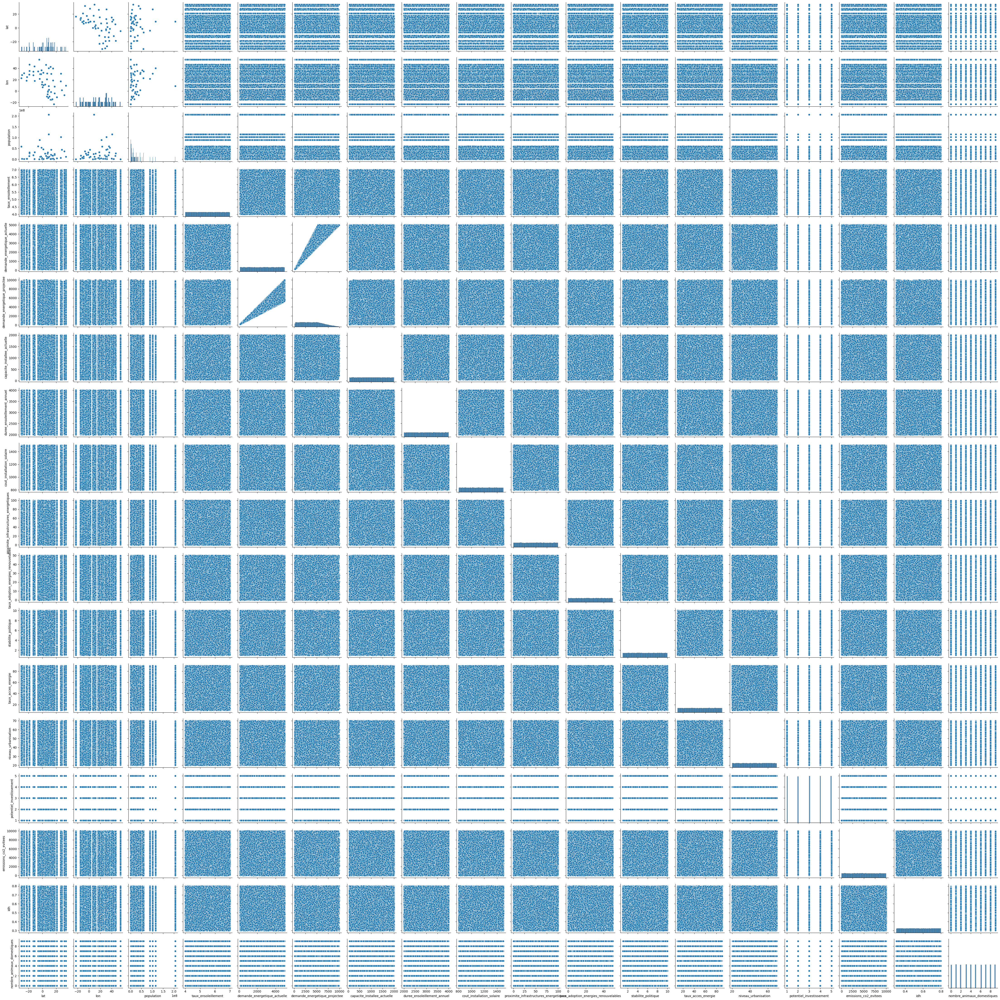

In [4]:
sns.pairplot(data)

In [5]:
data.dtypes

country                                    object
lat                                       float64
lon                                       float64
population                                  int64
taux_ensoleillement                       float64
demande_energetique_actuelle              float64
demande_energetique_projectee             float64
capacite_installee_actuelle               float64
duree_ensoleillement_annuel               float64
cout_installation_solaire                 float64
proximite_infrastructures_energetiques    float64
taux_adoption_energies_renouvelables      float64
stabilite_politique                       float64
taux_acces_energie                        float64
niveau_urbanisation                       float64
potentiel_investissement                    int64
types_sols                                 object
emissions_co2_evitees                     float64
idh                                       float64
habit_de_mariage                           object


In [6]:
dataquanti= data.select_dtypes(include='number')
dataquanti.corr()
corr_matrix=dataquanti.corr()
plt.figure(figsize=(12, 10))
# Affichage de la matrice de corrélation sous forme de heatmap avec seaborn
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")

<AxesSubplot:>

In [7]:
# Les Doublons
doublons = data.duplicated()
doublons.sum()

0

In [8]:
# Valeurs manquantes
data.isnull().sum()

country                                       0
lat                                           0
lon                                           0
population                                    0
taux_ensoleillement                           0
demande_energetique_actuelle                  0
demande_energetique_projectee                 0
capacite_installee_actuelle                   0
duree_ensoleillement_annuel                   0
cout_installation_solaire                     0
proximite_infrastructures_energetiques        0
taux_adoption_energies_renouvelables      15136
stabilite_politique                           0
taux_acces_energie                            0
niveau_urbanisation                           0
potentiel_investissement                      0
types_sols                                    0
emissions_co2_evitees                         0
idh                                           0
habit_de_mariage                              0
nombre_animaux_domestiques              

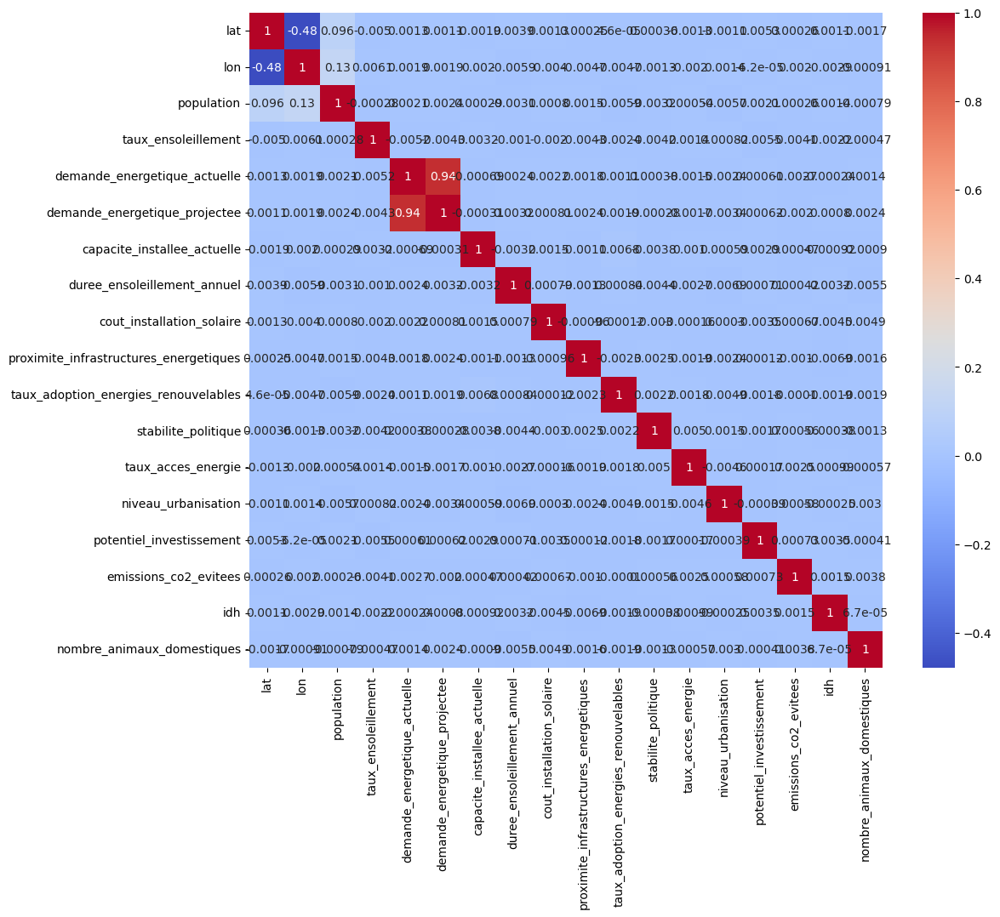

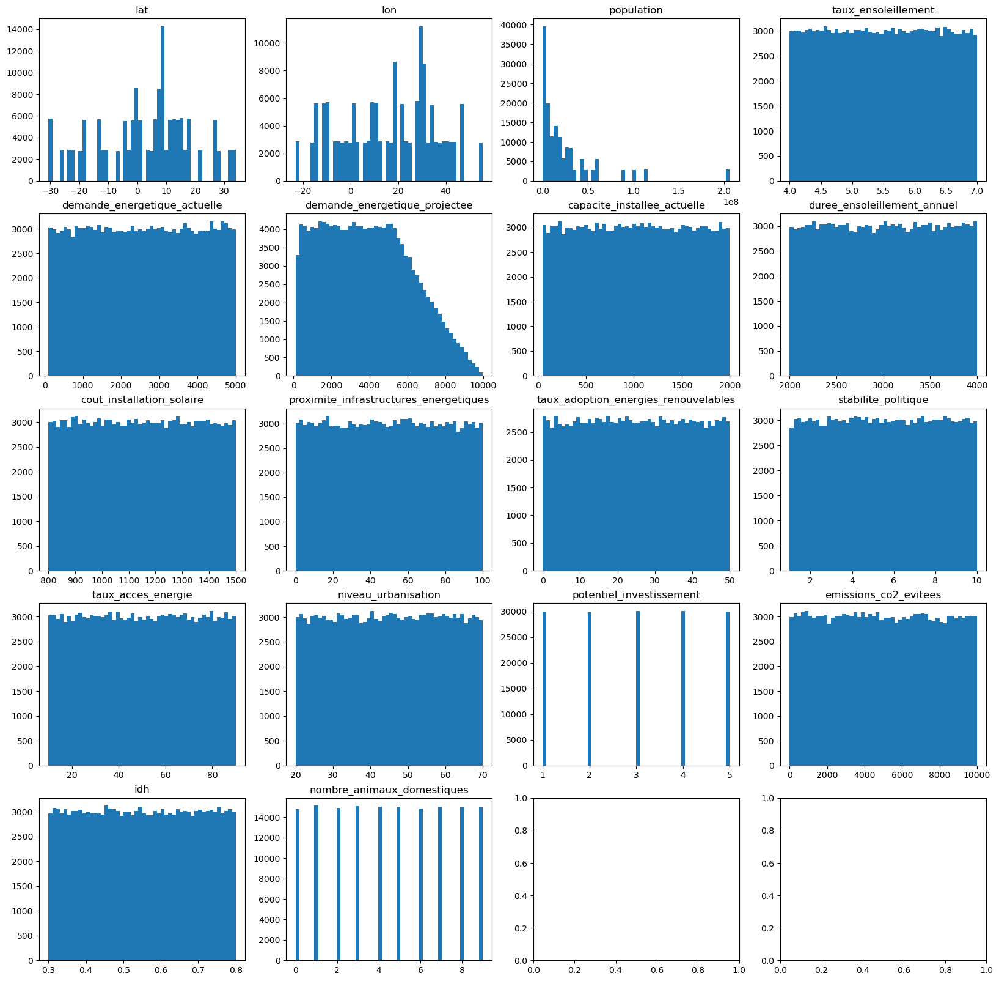

In [9]:
# Visualisation de la distribution des variables
fig, axs = plt.subplots(5, 4, figsize=(20, 20))
axs = axs.ravel()

for i, column in enumerate(dataquanti.columns):
    axs[i].hist(data[column], bins=50)
    axs[i].set_title(column)

plt.show()

In [ ]:
val_quali=['habit_de_mariage','country','types_sols']
for var in val_quali :
    data[var].value_counts().plot(kind='pie',autopct='%1.1f%%')
    plt.title(var)
    plt.axis('equal')
    plt.show()

## Visualisation mutivarie (très important ) on laisse d'abord

# Test Statistiques

In [10]:
# Import des librairies nécessaires
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.linear_model import PoissonRegressor, BayesianRidge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor
#from adaboost import AdaRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import numpy as np

In [11]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:
# Ajouter une colonne pour identifier la source des données
data['dataset'] = 'train'
datatest['dataset'] = 'line'  # ou 'line', si c'est un autre jeu de données
data_test['dataset'] = 'test'

# Fusionner les DataFrames
df = pd.concat([data, datatest, data_test], ignore_index=True)

# Vérifier la fusion
print(df.shape)

# Maintenant, tu peux travailler sur df, par exemple, appliquer des prétraitements.

(237500, 22)


In [13]:
# Liste des colonnes à conserver en fonction de leur contribution
columns_to_keep = ['dataset','demande_energetique_actuelle',
    'population', 'country', 'lat', 'lon', 
    'duree_ensoleillement_annuel'
    , 'idh', 'capacite_installee_actuelle', 'taux_adoption_energies_renouvelables','niveau_urbanisation','demande_energetique_projectee'
]
#'potentiel_investissement','emissions_co2_evitees', 
# Fonction pour sélectionner les colonnes dans un DataFrame
def select_columns(df, columns):
    available_columns = [col for col in columns if col in df.columns]
    return df[available_columns]

# Appliquer la fonction au DataFrame
data_selected = select_columns(df, columns_to_keep)

# Afficher les premières lignes pour vérifier la sélection
print(data_selected.head())
data=data_selected

  dataset  demande_energetique_actuelle  population              country  \
0   train                    485.085906    14862924             Zimbabwe   
1   train                   1422.802172     5518092  Congo (Brazzaville)   
2   train                   4711.082367     2540905              Namibia   
3   train                    799.426659    15893222              Somalia   
4   train                   2526.920477    89561403     Congo (Kinshasa)   

       lat      lon  duree_ensoleillement_annuel       idh  \
0 -19.0154  29.1549                  3936.978948  0.441787   
1  -0.2280  15.8277                  3753.749894  0.380139   
2 -22.9576  18.4904                  3804.854034  0.678362   
3   5.1521  46.1996                  2047.305693  0.731126   
4  -4.0383  21.7587                  3421.335117  0.357112   

   capacite_installee_actuelle  taux_adoption_energies_renouvelables  \
0                   583.128945                             14.282752   
1                   163.90

In [14]:
from sklearn.preprocessing import (LabelEncoder, OrdinalEncoder, OneHotEncoder,
                                    LabelBinarizer, MultiLabelBinarizer)
label = LabelEncoder()
#data['habit_de_mariage']=label.fit_transform(data['habit_de_mariage'])
#data['types_sols']=label.fit_transform(data['types_sols'])
data['country']=label.fit_transform(data['country'])
#data_test['habit_de_mariage']=label.fit_transform(data_test['habit_de_mariage'])
#data_test['types_sols']=label.fit_transform(data_test['types_sols'])
#data_test['country']=label.fit_transform(data_test['country'])
#datatest['habit_de_mariage']=label.fit_transform(datatest['habit_de_mariage'])
#datatest['types_sols']=label.fit_transform(datatest['types_sols'])
#datatest['country']=label.fit_transform(datatest['country'])

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\1193615605.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['country']=label.fit_transform(data['country'])


In [15]:
# Utiliser pd.get_dummies pour encoder les colonnes
#data = pd.get_dummies(data, columns=['country','types_sols'])


In [16]:
data.columns

Index(['dataset', 'demande_energetique_actuelle', 'population', 'country',
       'lat', 'lon', 'duree_ensoleillement_annuel', 'idh',
       'capacite_installee_actuelle', 'taux_adoption_energies_renouvelables',
       'niveau_urbanisation', 'demande_energetique_projectee'],
      dtype='object')

In [17]:
data_manquante_knn= data.copy()
data_manquante_mediane = data.copy()
data_manquante_moyenne = data.copy()
data_manquante_iterrative = data.copy()

In [18]:
#On devrait juste emputer anciennete puisue 30 % mais c'est une variable importante dans la sélection métier
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer
from sklearn.impute import MissingIndicator, KNNImputer,SimpleImputer
# Imputation par KNN Imputer
# KNN imputer avec 3 voisins pour plusieurs colonnes
#imputer2 = KNNImputer(n_neighbors=10)
imputer = IterativeImputer(max_iter=10, random_state=0)

data_manquante_knn['taux_adoption_energies_renouvelables'] = imputer.fit_transform(data_manquante_iterrative[['taux_adoption_energies_renouvelables']])

In [19]:
data_finale= data_manquante_knn.copy()
# Pour séparer à nouveau en 'train' et 'test' :
data_train = data_finale[data_finale['dataset'] == 'train'].drop(columns=['dataset'])
data_test = data_finale[data_finale['dataset'] == 'test'].drop(columns=['dataset'])
datatest = data_finale[data_finale['dataset'] == 'line'].drop(columns=['dataset'])

# Vérifier les résultats
print("Train DataFrame:", data_test.shape)
print("Test DataFrame:", datatest.shape)

Train DataFrame: (62500, 11)
Test DataFrame: (25000, 11)


In [20]:
datatest

,demande_energetique_actuelle,population,country,lat,lon,duree_ensoleillement_annuel,idh,capacite_installee_actuelle,taux_adoption_energies_renouvelables,niveau_urbanisation,demande_energetique_projectee
150000,2288.205830,7976983,42,8.4606,-11.7799,3856.453895,0.722109,1506.365949,25.196118,58.938006,NaN
150001,2402.680846,7976983,42,8.4606,-11.7799,3652.332264,0.518997,1878.297944,27.037202,58.293952,NaN
150002,3996.471566,11193725,45,6.8769,31.3069,3810.507756,0.785365,344.400305,47.880078,24.914731,NaN
150003,3134.406856,31255435,34,-18.6657,35.5296,3319.984749,0.400865,1614.664206,40.282065,35.089942,NaN
150004,2560.551232,14862924,52,-19.0154,29.1549,2829.581194,0.516602,1151.776893,10.630429,46.989207,NaN
...,...,...,...,...,...,...,...,...,...,...,...
174995,4668.906579,14862924,52,-19.0154,29.1549,2416.010087,0.546158,1682.285214,18.204734,36.193899,NaN
174996,4790.888011,16743927,40,14.4974,-14.4524,2490.983578,0.787345,483.548704,19.211432,36.136465,NaN
174997,2840.640220,43849260,46,12.8628,30.2176,3196.271094,0.450761,260.516323,27.712440,26.555521,NaN
174998,2383.927811,45741007,50,1.3733,32.2903,3615.998294,0.381448,1689.060842,26.731811,28.741820,NaN


In [21]:
#data_finale= data_manquante_knn.copy()
# Sélection des variables basée sur la variance
data_finale= data_train
X= data_finale.drop('demande_energetique_projectee',axis = 1)
y= data_finale['demande_energetique_projectee']

In [22]:
# Import des librairies nécessaires
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.linear_model import PoissonRegressor, BayesianRidge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor
#from adaboost import AdaRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import numpy as np



# Liste des modèles de régression
modedls={"Adaboost":AdaBoostRegressor(n_estimators=100)}
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.5),
    #"Polynomial Regression (degree 2)": make_pipeline(PolynomialFeatures(degree=2), LinearRegression()),
    #"Polynomial Regression (degree 3)": make_pipeline(PolynomialFeatures(degree=3), LinearRegression()),
    #"Poisson Regression": PoissonRegressor(),
    "Bayesian Ridge": BayesianRidge(),
    #"Decision Tree Regressor": DecisionTreeRegressor(),
    #"Random Forest Regressor": RandomForestRegressor(n_estimators=100),
    #"Gradient Boosting Regressor": GradientBoostingRegressor(n_estimators=100),
    #"XGBoost Regressor": XGBRegressor(objective='reg:squarederror', n_estimators=100),
    #"LightGBM Regressor": LGBMRegressor(objective='regression', n_estimators=100),
    #"CatBoost Regressor": CatBoostRegressor(verbose=0),
    #"Support Vector Regressor": SVR(),
    #"K-Nearest Neighbors Regressor": KNeighborsRegressor(n_neighbors=5)
}

# Métrique pour la validation croisée (ici on utilise l'erreur quadratique moyenne)
scoring = make_scorer(mean_squared_error, greater_is_better=False)

# Effectuer la validation croisée pour chaque modèle et afficher les scores
for name, model in models.items():
    # Calcul des scores de validation croisée
    scores = cross_val_score(model, X, y, cv=5, scoring=scoring)  # cv=5 pour 5-fold cross-validation
    print(f"{name}: MSE = {-np.mean(scores):.4f} (+/- {np.std(scores):.4f})")

Linear Regression: MSE = 640048.9315 (+/- 804.1356)


C:\Users\HOME\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.64575e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\HOME\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.62695e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\HOME\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.64886e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\HOME\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.63003e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\HOME\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:216: Li

Ridge Regression: MSE = 640048.9277 (+/- 804.1348)
Lasso Regression: MSE = 640049.0512 (+/- 805.3585)
Elastic Net: MSE = 640045.6829 (+/- 802.8453)
Bayesian Ridge: MSE = 640042.6587 (+/- 800.0797)


In [23]:

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
train_X=X
train_y=y
test_X=data_test
test_y=test_X['demande_energetique_projectee']
test_X=test_X.drop('demande_energetique_projectee',axis = 1)
#test_X=scaler.fit_transform(test_X)


In [24]:

from sklearn.metrics import mean_absolute_error, median_absolute_error, explained_variance_score,r2_score,mean_squared_error
X_train= train_X
X_test= test_X
y_test= test_y
y_train= train_y
#param={'alpha_1': 2.3683663542682695e-06, 'alpha_2': 1.750584164083431e-06, 'lambda_1': 0.0009912754254678097, 'lambda_2': 1.1598079171112289e-07}
#model=ElasticNet(alpha= 97.32185381894733, l1_ratio=0.9811781107842863)
model=BayesianRidge()
tree=model.fit(train_X, train_y)
# Obtention du tableau de résultats
# Prédiction sur la base d'apprentissage et la base de test
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

# Calcul des métriques sur la base d'apprentissage et la base de test
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_medae = median_absolute_error(y_train, y_train_pred)
test_medae = median_absolute_error(y_test, y_test_pred)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
train_evs = explained_variance_score(y_train, y_train_pred)
test_evs = explained_variance_score(y_test, y_test_pred)
# Affichage des résultats dans un tableau
results = pd.DataFrame({'Métrique': ['RMSE', 'MAE', 'MedAE', 'R2', 'EVS'], 
                        'Apprentissage': [train_rmse, train_mae, train_medae, train_r2, train_evs], 
                        'Test': [test_rmse, test_mae, test_medae, test_r2, test_evs]})
results.set_index('Métrique', inplace=True)
print(results)
print(model)
#La définition d'un random_state n'a aucun effet puisque shuffle est False. Vous devez laisser random_state sa valeur par défaut (Aucun) ou définir shuffle=True

          Apprentissage        Test
Métrique                           
RMSE         799.974071  796.645021
MAE          605.925536  602.659199
MedAE        458.171995  455.007045
R2             0.879502    0.879636
EVS            0.879502    0.879637
BayesianRidge()


In [25]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import numpy as np

# Standardiser les données d'entraînement et de test
scaler = MinMaxScaler()

In [26]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import numpy as np

datatest=datatest.drop("demande_energetique_projectee",axis=1)
# Variables importantes
#important_features = ["demande_energetique_actuelle", "cout_installation_solaire", "capacite_installee_actuelle"]
important_features = ["demande_energetique_actuelle"]
# Sélectionner les variables importantes
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]
datatest_important = datatest[["demande_energetique_actuelle"]]
# Standardiser les variables importantes
X_train_combine = scaler.fit_transform(X_train.drop(important_features, axis=1))
X_test_combine = scaler.fit_transform(X_test.drop(important_features, axis=1))
datatest= scaler.fit_transform(datatest.drop(important_features, axis=1))


# Appliquer PCA sur les autres variables
pca = PCA(n_components=4)  # nombre de composantes à définir selon l'explication de la variance
X_train_pca = pca.fit_transform(X_train_combine)
X_test_pca = pca.transform(X_test_combine)
datatest = pca.transform(datatest)
# Concaténer les variables importantes et les composantes principales
X_train_combined = np.hstack((X_train_important, X_train_pca))
X_test_combined = np.hstack((X_test_important, X_test_pca))
datatest_combined = np.hstack((datatest_important, datatest))

In [27]:

# Initialiser et entraîner le modèle
model = BayesianRidge()
model.fit(X_train_combined, y_train)

# Prédire et calculer le RMSE
y_pred_combined = model.predict(X_test_combined)
rmse_combined = np.sqrt(mean_squared_error(y_test, y_pred_combined))
print(f"RMSE avec les variables importantes et PCA: {rmse_combined:.4f}")

RMSE avec les variables importantes et PCA: 796.6048


In [28]:
import optuna
from sklearn.linear_model import BayesianRidge
from sklearn.datasets import make_regression

# Fonction d'objectif pour l'optimisation de Bayesian Ridge Regression
def objective_bayesianridge(trial):
    alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
    alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
    lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
    lambda_2 = trial.suggest_loguniform("lambda_2", 1e-7, 1e-3)

    model = BayesianRidge(alpha_1=alpha_1, alpha_2=alpha_2, lambda_1=lambda_1, lambda_2=lambda_2)
    score = cross_val_score(model, X_train_combined, y, cv=5, scoring="neg_mean_squared_error").mean()
    return score

# Création de l’étude Optuna pour Bayesian Ridge
study_bayesianridge = optuna.create_study(direction="maximize")
study_bayesianridge.optimize(objective_bayesianridge, n_trials=200)

print("Best parameters for Bayesian Ridge:", study_bayesianridge.best_params)
print("Best MSE score for Bayesian Ridge:", study_bayesianridge.best_value)


[I 2024-12-18 18:22:06,291] A new study created in memory with name: no-name-dc393718-ab2e-42dc-a47e-2288d3233dc8
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0

[I 2024-12-18 18:22:08,465] Trial 5 finished with value: -640002.9655475093 and parameters: {'alpha_1': 5.820357361519841e-06, 'alpha_2': 1.1469858848673986e-06, 'lambda_1': 1.462946590831958e-07, 'lambda_2': 7.697029185203477e-07}. Best is trial 4 with value: -640002.9654919554.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:12,203] Trial 16 finished with value: -640002.9655474151 and parameters: {'alpha_1': 1.7683702813688663e-06, 'alpha_2': 5.25753153798886e-07, 'lambda_1': 6.463183701146842e-07, 'lambda_2': 2.1642329040253766e-06}. Best is trial 14 with value: -640002.9653533068.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\97357032

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:15,273] Trial 27 finished with value: -640002.9655083509 and parameters: {'alpha_1': 7.488531906200049e-06, 'alpha_2': 8.853357830241374e-07, 'lambda_1': 2.7974892355873005e-07, 'lambda_2': 0.000196014044021032}. Best is trial 14 with value: -640002.9653533068.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:18,495] Trial 38 finished with value: -640002.965505052 and parameters: {'alpha_1': 1.0750993120596664e-06, 'alpha_2': 2.0637395667201113e-05, 'lambda_1': 6.56506620832955e-06, 'lambda_2': 0.00022407935566131086}. Best is trial 14 with value: -640002.9653533068.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\97357032

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:22,143] Trial 49 finished with value: -640002.9654276257 and parameters: {'alpha_1': 0.00031340210535158765, 'alpha_2': 4.853164874488701e-07, 'lambda_1': 3.0283579330632935e-06, 'lambda_2': 0.0006031650845687822}. Best is trial 41 with value: -640002.9653485294.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\9735703

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:26,192] Trial 60 finished with value: -640002.965529904 and parameters: {'alpha_1': 2.231468868267765e-07, 'alpha_2': 4.374113347824071e-07, 'lambda_1': 7.496739413384687e-07, 'lambda_2': 8.955219376044085e-05}. Best is trial 52 with value: -640002.9653474602.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:29,680] Trial 71 finished with value: -640002.9653644364 and parameters: {'alpha_1': 5.465087499496786e-07, 'alpha_2': 4.153341690487934e-07, 'lambda_1': 2.9108638847210155e-05, 'lambda_2': 0.00096627378107403}. Best is trial 52 with value: -640002.9653474602.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:32,895] Trial 82 finished with value: -640002.9653491222 and parameters: {'alpha_1': 1.9819290002011755e-07, 'alpha_2': 1.6351757406841777e-07, 'lambda_1': 2.557200748089072e-06, 'lambda_2': 0.0009934044016445497}. Best is trial 52 with value: -640002.9653474602.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\9735703

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:36,164] Trial 93 finished with value: -640002.9653474415 and parameters: {'alpha_1': 2.054367199142294e-07, 'alpha_2': 5.542500511552827e-07, 'lambda_1': 5.627258990414453e-07, 'lambda_2': 0.000998085321447753}. Best is trial 93 with value: -640002.9653474415.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:39,609] Trial 104 finished with value: -640002.9655473359 and parameters: {'alpha_1': 2.908128784890833e-07, 'alpha_2': 1.8136084948671878e-07, 'lambda_1': 1.835957921442424e-07, 'lambda_2': 1.7023067010772077e-06}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:43,414] Trial 115 finished with value: -640002.9653478803 and parameters: {'alpha_1': 3.1824081457998306e-07, 'alpha_2': 7.945714328700363e-07, 'lambda_1': 6.586972652462843e-07, 'lambda_2': 0.0009960767160156648}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\9735703

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:46,982] Trial 126 finished with value: -640002.9653923291 and parameters: {'alpha_1': 2.85330927234716e-07, 'alpha_2': 3.325397188781446e-07, 'lambda_1': 5.877153616325459e-07, 'lambda_2': 0.0007744861873062516}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:50,184] Trial 137 finished with value: -640002.9654071863 and parameters: {'alpha_1': 1.5586633366749147e-07, 'alpha_2': 2.4101883643669523e-07, 'lambda_1': 1.5497058511981063e-06, 'lambda_2': 0.0007022516833357297}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\97357

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:53,437] Trial 148 finished with value: -640002.965347496 and parameters: {'alpha_1': 3.4317864151971536e-07, 'alpha_2': 1.6844006887842158e-07, 'lambda_1': 1.0779454006158807e-06, 'lambda_2': 0.0009987677727281488}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:22:57,684] Trial 159 finished with value: -640002.9654482317 and parameters: {'alpha_1': 2.4359106146380396e-07, 'alpha_2': 2.1509809467152355e-07, 'lambda_1': 3.605647997207269e-07, 'lambda_2': 0.0004955885070453795}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:23:01,661] Trial 170 finished with value: -640002.9655473729 and parameters: {'alpha_1': 3.514188278251387e-07, 'alpha_2': 0.0001938855095700006, 'lambda_1': 1.203897500160339e-06, 'lambda_2': 3.4065790420849537e-06}. Best is trial 96 with value: -640002.9653470605.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\9735703

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:23:05,021] Trial 181 finished with value: -640002.9653470444 and parameters: {'alpha_1': 1.2002345298068356e-07, 'alpha_2': 5.693035469350136e-07, 'lambda_1': 2.433545299294351e-07, 'lambda_2': 0.00099947172808645}. Best is trial 181 with value: -640002.9653470444.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\97357032

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

[I 2024-12-18 18:23:08,451] Trial 192 finished with value: -640002.9653822582 and parameters: {'alpha_1': 1.3760666384862623e-07, 'alpha_2': 7.034449373897742e-07, 'lambda_1': 2.2867890279655812e-07, 'lambda_2': 0.000823995752171653}. Best is trial 181 with value: -640002.9653470444.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\973570321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Users

Best parameters for Bayesian Ridge: {'alpha_1': 1.2002345298068356e-07, 'alpha_2': 5.693035469350136e-07, 'lambda_1': 2.433545299294351e-07, 'lambda_2': 0.00099947172808645}
Best MSE score for Bayesian Ridge: -640002.9653470444


In [29]:
param= {'alpha_1': 2.4951072412651018e-06, 'alpha_2': 1.5321115299169622e-06, 'lambda_1': 1.5070667206928703e-07, 'lambda_2': 0.0009994746628511815}
model = BayesianRidge(**param)
model.fit(X_train_combined, y_train)
line=model.predict(datatest_combined)
# Création de l'ID en fonction de la longueur de `line`
ids = range(1, len(line) + 1)

# Création du DataFrame avec les colonnes attendues
submission_df = pd.DataFrame({
    'id': ids,
    'demande_energetique_projectee': line
})

# Spécifiez le nom de votre fichier de sortie
output_file = 'submissionfin10.csv'

# Exporter le DataFrame au format CSV
submission_df.to_csv(output_file, index=False)

print(f"Le fichier {output_file} a été exporté avec succès.")

Le fichier submissionfin10.csv a été exporté avec succès.


In [30]:
🛑STOP

SyntaxError: invalid character '🛑' (U+1F6D1) (3430450797.py, line 1)

In [31]:
datatest

array([[-4.47123205e-02,  2.86414517e-01,  3.08578236e-01,
         1.72859329e-01],
       [-3.84433141e-02,  4.76658948e-04, -2.99069286e-02,
         2.95172585e-01],
       [ 3.03597968e-01,  7.90756121e-01,  1.37093699e-01,
        -8.76980287e-02],
       ...,
       [ 2.93684683e-01,  2.79317189e-01, -3.49248965e-01,
        -2.63146842e-01],
       [ 4.41894131e-01,  1.78879433e-01, -5.05342205e-01,
         3.67980799e-01],
       [-2.67236503e-02, -1.58109784e-01, -2.20733546e-01,
        -3.67811607e-01]])

In [32]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import numpy as np

# Appliquer PCA sur les autres variables
pca = PCA(n_components=4)  # nombre de composantes à définir selon l'explication de la variance
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)



In [33]:

# Initialiser et entraîner le modèle
param1= {'alpha_1': 4.185699378915085e-06, 'alpha_2': 0.000180219463114488, 'lambda_1': 0.0009998498307439477, 'lambda_2': 8.275330918230712e-07}
model= BayesianRidge(**param1)
#model = ElasticNet(alpha=68.47250526984874, l1_ratio=0.7602874859640734, random_state=0)
model.fit(X_train_pca, y_train)

# Prédire et calculer le RMSE
y_pred_pca = model.predict(X_test_pca)
rmse_combined = np.sqrt(mean_squared_error(y_test, y_pred_pca))
print(f"RMSE avec les variables importantes et PCA: {rmse_combined:.4f}")

RMSE avec les variables importantes et PCA: 796.6218


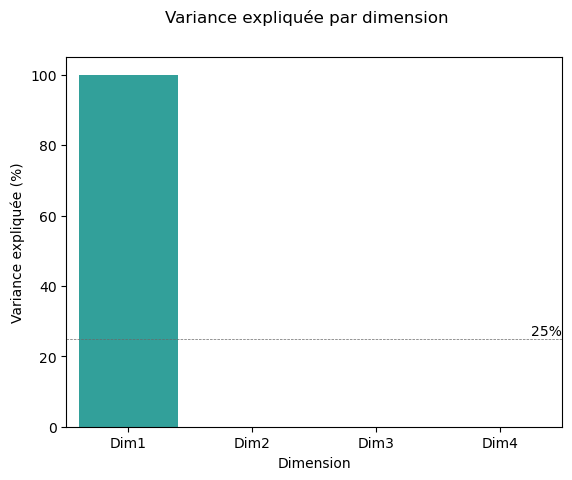

In [34]:
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Supposons que X_train_pca soit déjà réduit avec PCA
pca = PCA()
X_pca = pca.fit_transform(X_train_pca)

# Analyse des valeurs propres
comp = pd.DataFrame({
    "Dimension" : ["Dim" + str(x + 1) for x in range(X_pca.shape[1])], 
    "Valeur propre" : pca.explained_variance_,
    "% variance expliquée" : np.round(pca.explained_variance_ratio_ * 100),
    "% cum. var. expliquée" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
})

# Scree plot
g_comp = sns.barplot(x="Dimension", 
                     y="% variance expliquée", 
                     palette=["lightseagreen"], 
                     data=comp)
g_comp.set(ylabel="Variance expliquée (%)")
g_comp.figure.suptitle("Variance expliquée par dimension")
plt.axhline(y=25, linewidth=0.5, color="dimgray", linestyle="--")  # Seuil de 25%
plt.text(3.25, 26, "25%")
plt.show()


In [35]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA



# Calcul du cosinus carré des variables
cos_squared = np.square(pca.components_)

# Créer un DataFrame avec le cosinus carré des variables
df_cos_squared = pd.DataFrame(cos_squared, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Affecter un index numérique (utilisez les noms des colonnes si vous les avez sous forme de liste)
df_cos_squared.index = [f'Variable {i+1}' for i in range(X_pca.shape[1])]

print(df_cos_squared)


                     PC1           PC2           PC3           PC4
Variable 1  1.000000e+00  1.892596e-35  4.545595e-39  2.473260e-40
Variable 2  1.892596e-35  1.000000e+00  9.966365e-21  4.509838e-22
Variable 3  4.545595e-39  9.966368e-21  1.000000e+00  5.327426e-24
Variable 4  2.473260e-40  4.509839e-22  5.326933e-24  1.000000e+00


In [36]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Exemple de données X, à remplacer par vos propres données d'entrée
# X = ...  # DataFrame avec vos données

# Initialiser le scaler et appliquer une normalisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Appliquer PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Convertir X_pca en DataFrame pour garder les noms des composantes principales
X_train_pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Calculer les vecteurs propres (loadings) et les valeurs propres (eigenvalues)
loadings = pca.components_.T  # Vecteurs propres des composantes principales
eigenvalues = pca.explained_variance_

# Calculer la contribution des variables à la formation des axes
variable_contributions = (loadings**2) * eigenvalues

# Créer un DataFrame pour faciliter l'affichage des résultats
column_names = [f'PC{i+1}_contrib' for i in range(X_pca.shape[1])]
variable_contrib_df = pd.DataFrame(variable_contributions, columns=column_names, index=X.columns)

# Afficher le DataFrame des contributions
print(variable_contrib_df)


                                       PC1_contrib  PC2_contrib   PC3_contrib  \
demande_energetique_actuelle          6.311412e-06     0.001419  1.067776e-01   
population                            1.131826e-02     0.733687  9.064228e-04   
country                               1.272727e-01     0.213357  6.802195e-05   
lat                                   6.598270e-01     0.121391  3.157848e-04   
lon                                   7.282219e-01     0.000925  4.140591e-07   
duree_ensoleillement_annuel           3.496652e-04     0.000814  3.562941e-01   
idh                                   2.680464e-05     0.000689  1.814155e-02   
capacite_installee_actuelle           2.960448e-05     0.000267  1.390155e-03   
taux_adoption_energies_renouvelables  1.061631e-04     0.005023  1.182965e-01   
niveau_urbanisation                   9.289472e-09     0.006914  4.078815e-01   

                                       PC4_contrib   PC5_contrib  \
demande_energetique_actuelle          3.

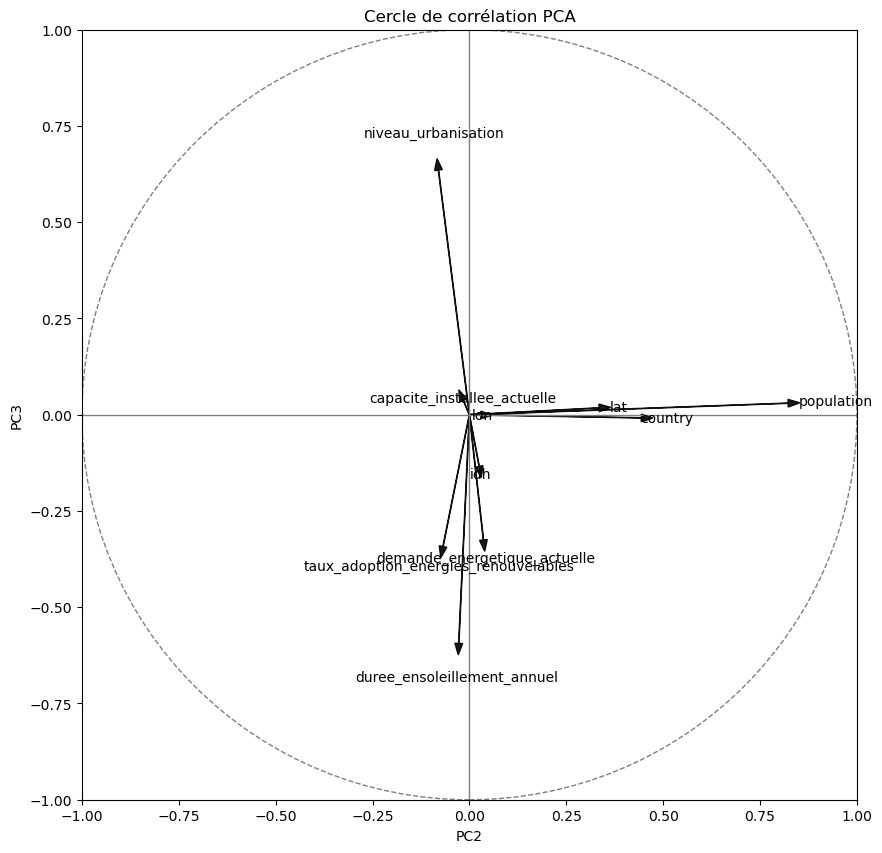

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que vous ayez déjà les variables pca et X_train_pca

# Coefficients des composantes principales (PC1 et PC2)
coeff = np.transpose(pca.components_[1:4, :])  # Composantes principales PC1 et PC2
n = coeff.shape[0]

# Créer la figure
plt.figure(figsize=(10, 10))

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, X.columns[i], color='k', ha='center', va='center')

# Placer le cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajuster les limites et les axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('PC2')
plt.ylabel('PC3')
plt.title('Cercle de corrélation PCA')

# Afficher la figure
plt.show()


In [38]:
datatest=datatest.drop('demande_energetique_projectee',axis=1)

AttributeError: 'numpy.ndarray' object has no attribute 'drop'

In [ ]:
y_pred_pca1.shape

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge, LinearRegression
from sklearn.ensemble import StackingRegressor

# Définition des modèles de base
param={'alpha_1': 0.0006991577581295645, 'alpha_2': 5.892619281966824e-06, 'lambda_1': 0.0009990957371391216, 'lambda_2': 2.384017446424604e-06}
base_models = [
    ('ridge', BayesianRidge(**param)),
    ('rf',ElasticNet(alpha= 97.32185381894733, l1_ratio=0.9811781107842863)),
    ('ll',LinearRegression())
]
# Modèle de méta-apprentissage
stacking_model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())

# Entraînement et évaluation
stacking_model.fit(train_X, train_y)
y_pred_stack = stacking_model.predict(test_X)
rmse_stack = np.sqrt(mean_squared_error(test_y, y_pred_stack))
print(f"RMSE avec le stacking : {rmse_stack:.4f}")


In [ ]:


# Visualisation de la variance expliquée
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Nombre de Composantes Principales')
plt.ylabel('Variance Cumulative Expliquée')
plt.title("Variance Cumulative Expliquée par l'ACP")
plt.grid()
plt.show()

# Affichage des contributions des variables dans les premiers composants
num_components = 5  # Par exemple, afficher les 5 premières composantes
loadings = pd.DataFrame(pca.components_[:num_components], columns=X_train_combined[0])
plt.figure(figsize=(12, 8))
for i in range(num_components):
    plt.bar(train.columns, loadings.iloc[i], label=f'Composante {i+1}')
plt.xlabel("Variables")
plt.ylabel("Contribution")
plt.title("Contribution des Variables aux Composantes Principales")
plt.legend()
plt.xticks(rotation=90)
plt.show()


In [39]:
import optuna
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_regression


# Fonction d'objectif pour l'optimisation d'ElasticNet
def objective_elasticnet(trial):
    alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
    l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, random_state=0)
    # Validation croisée
    score = cross_val_score(model, X_train_combined, y, cv=5, scoring="neg_mean_squared_error").mean()
    return score

# Création de l'étude Optuna pour ElasticNet
study_elasticnet = optuna.create_study(direction="maximize")
study_elasticnet.optimize(objective_elasticnet, n_trials=100)

print("Best parameters for ElasticNet:", study_elasticnet.best_params)
print("Best MSE score for ElasticNet:", study_elasticnet.best_value)


[I 2024-12-18 18:24:02,955] A new study created in memory with name: no-name-99348ad5-1e2e-4c92-b39e-bccdfacfa8eb
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:03,133] Trial 0 finished with value: -640015.8053901915 and parameters: {'alpha': 0.005945887240304159, 'l1_ratio': 0.7488721064085236}. Best is trial 0 with value: -640015.8053901915.
C:\Users\HOME\AppData\Local\Temp\ipykernel_1

[I 2024-12-18 18:24:04,701] Trial 9 finished with value: -640011.7369524831 and parameters: {'alpha': 0.01652472004448744, 'l1_ratio': 0.13972556942879788}. Best is trial 6 with value: -640003.2940728364.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:04,875] Trial 10 finished with value: -640003.2957582979 and parameters: {'alpha': 71.65331794803822, 'l1_ratio': 0.9874828378357052}. Bes

[I 2024-12-18 18:24:06,448] Trial 19 finished with value: -640002.0227044766 and parameters: {'alpha': 0.30895887000461436, 'l1_ratio': 0.05076804815329372}. Best is trial 19 with value: -640002.0227044766.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:06,617] Trial 20 finished with value: -640002.1132687725 and parameters: {'alpha': 0.2312029547267604, 'l1_ratio': 0.00771999955510921}.

[I 2024-12-18 18:24:08,154] Trial 29 finished with value: -640015.3475107444 and parameters: {'alpha': 0.0034999443047938087, 'l1_ratio': 0.0886687887544777}. Best is trial 26 with value: -640001.9808151474.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:08,348] Trial 30 finished with value: -640013.859958451 and parameters: {'alpha': 0.011844330471248827, 'l1_ratio': 0.4394658379180739}

[I 2024-12-18 18:24:09,901] Trial 39 finished with value: -640003.2924402864 and parameters: {'alpha': 6.884824414482608, 'l1_ratio': 0.24045918210772704}. Best is trial 26 with value: -640001.9808151474.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:10,098] Trial 40 finished with value: -640003.3161147928 and parameters: {'alpha': 0.11449292717204253, 'l1_ratio': 0.14216449128516562}. 

[I 2024-12-18 18:24:11,683] Trial 49 finished with value: -640002.0196976408 and parameters: {'alpha': 0.31512522906846774, 'l1_ratio': 0.05484843797437207}. Best is trial 26 with value: -640001.9808151474.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:11,849] Trial 50 finished with value: -640002.511290706 and parameters: {'alpha': 0.8853623757182264, 'l1_ratio': 0.22354592351621977}. 

[I 2024-12-18 18:24:13,618] Trial 59 finished with value: -640002.0872276116 and parameters: {'alpha': 0.7722959432926589, 'l1_ratio': 0.8174856850255927}. Best is trial 56 with value: -640001.8336477285.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:13,823] Trial 60 finished with value: -640003.2923901288 and parameters: {'alpha': 4.859345794987312, 'l1_ratio': 0.8960024052634766}. Bes

[I 2024-12-18 18:24:16,079] Trial 69 finished with value: -640001.8566537958 and parameters: {'alpha': 0.5748459000062136, 'l1_ratio': 0.9600682505792428}. Best is trial 66 with value: -640001.6280489626.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:16,333] Trial 70 finished with value: -640003.2929174112 and parameters: {'alpha': 24.56440289898972, 'l1_ratio': 0.9776622296802924}. Bes

[I 2024-12-18 18:24:18,493] Trial 79 finished with value: -640008.1232630083 and parameters: {'alpha': 0.1550424285163546, 'l1_ratio': 0.9272531774468052}. Best is trial 66 with value: -640001.6280489626.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:18,728] Trial 80 finished with value: -640001.9755929931 and parameters: {'alpha': 0.5139674400227678, 'l1_ratio': 0.8879027159268089}. Be

[I 2024-12-18 18:24:20,480] Trial 89 finished with value: -640016.6546922869 and parameters: {'alpha': 0.00040004862886924104, 'l1_ratio': 0.9962032688703133}. Best is trial 66 with value: -640001.6280489626.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3619933671.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:24:20,672] Trial 90 finished with value: -640002.2890302812 and parameters: {'alpha': 0.47656551027264005, 'l1_ratio': 0.7858110475763503

Best parameters for ElasticNet: {'alpha': 0.6217862413961383, 'l1_ratio': 0.934977271095082}
Best MSE score for ElasticNet: -640001.6280489626


In [40]:
from sklearn.linear_model import BayesianRidge
from sklearn.datasets import make_regression

# Fonction d'objectif pour l'optimisation de Bayesian Ridge Regression
def objective_bayesianridge(trial):
    alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
    alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
    lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
    lambda_2 = trial.suggest_loguniform("lambda_2", 1e-7, 1e-3)

    model = BayesianRidge(alpha_1=alpha_1, alpha_2=alpha_2, lambda_1=lambda_1, lambda_2=lambda_2)
    score = cross_val_score(model, X_train_combined, y, cv=5, scoring="neg_mean_squared_error").mean()
    return score

# Création de l’étude Optuna pour Bayesian Ridge
study_bayesianridge = optuna.create_study(direction="maximize")
study_bayesianridge.optimize(objective_bayesianridge, n_trials=200)

print("Best parameters for Bayesian Ridge:", study_bayesianridge.best_params)
print("Best MSE score for Bayesian Ridge:", study_bayesianridge.best_value)


[I 2024-12-18 18:24:22,324] A new study created in memory with name: no-name-646cdcd8-49b7-43b9-8793-63d0a168d687
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.

[I 2024-12-18 18:24:24,149] Trial 5 finished with value: -640002.9655482587 and parameters: {'alpha_1': 3.654547647389328e-07, 'alpha_2': 5.415087861010004e-06, 'lambda_1': 1.915927611869807e-06, 'lambda_2': 3.1393120684451174e-07}. Best is trial 4 with value: -640002.965399684.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005009

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:27,361] Trial 16 finished with value: -640002.965553501 and parameters: {'alpha_1': 7.851183472143824e-07, 'alpha_2': 0.0009757810431418256, 'lambda_1': 3.2328376705436884e-05, 'lambda_2': 3.0514276031092968e-05}. Best is trial 12 with value: -640002.965356609.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:30,933] Trial 27 finished with value: -640002.9656328838 and parameters: {'alpha_1': 1.4688632506963243e-07, 'alpha_2': 6.082082876273228e-05, 'lambda_1': 0.0002669588823346187, 'lambda_2': 6.964930158187134e-05}. Best is trial 12 with value: -640002.965356609.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:35,380] Trial 38 finished with value: -640002.9654940035 and parameters: {'alpha_1': 2.864864256986379e-05, 'alpha_2': 1.0117892811114812e-05, 'lambda_1': 9.053255229970869e-07, 'lambda_2': 0.0002686232324089138}. Best is trial 35 with value: -640002.9653565362.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:38,706] Trial 49 finished with value: -640002.9655329622 and parameters: {'alpha_1': 0.0008859263782761792, 'alpha_2': 0.00042602400196446, 'lambda_1': 2.091184214337484e-06, 'lambda_2': 7.679189287722083e-05}. Best is trial 35 with value: -640002.9653565362.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005009

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:41,855] Trial 60 finished with value: -640002.9655473933 and parameters: {'alpha_1': 2.633606631484442e-06, 'alpha_2': 0.0003143090841273778, 'lambda_1': 4.116262576262809e-07, 'lambda_2': 1.8384374718694595e-06}. Best is trial 35 with value: -640002.9653565362.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:45,468] Trial 71 finished with value: -640002.9653607726 and parameters: {'alpha_1': 9.531483111035862e-07, 'alpha_2': 0.00019776592297799498, 'lambda_1': 2.0321244864358605e-05, 'lambda_2': 0.0009682543662835807}. Best is trial 63 with value: -640002.9653559724.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\41600

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:49,960] Trial 82 finished with value: -640002.9654056417 and parameters: {'alpha_1': 2.007667497047489e-06, 'alpha_2': 0.0003435092637651616, 'lambda_1': 1.5981584600002198e-05, 'lambda_2': 0.0007366721054269482}. Best is trial 63 with value: -640002.9653559724.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:54,200] Trial 93 finished with value: -640002.9655433387 and parameters: {'alpha_1': 4.180038952518704e-06, 'alpha_2': 0.0003262683642072418, 'lambda_1': 1.446469467415128e-05, 'lambda_2': 4.804504635002238e-05}. Best is trial 63 with value: -640002.9653559724.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:24:58,110] Trial 104 finished with value: -640002.965381445 and parameters: {'alpha_1': 2.344396487958778e-06, 'alpha_2': 0.0004027770822773713, 'lambda_1': 8.092924162733876e-07, 'lambda_2': 0.0008291217293779399}. Best is trial 97 with value: -640002.9653482931.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:01,604] Trial 115 finished with value: -640002.9653820628 and parameters: {'alpha_1': 2.677584386949607e-06, 'alpha_2': 0.00028157295567016465, 'lambda_1': 6.9564887946234e-07, 'lambda_2': 0.0008258330363484995}. Best is trial 97 with value: -640002.9653482931.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:05,650] Trial 126 finished with value: -640002.9653820337 and parameters: {'alpha_1': 7.51858697047034e-07, 'alpha_2': 0.0009138246434386892, 'lambda_1': 2.1397178501539278e-07, 'lambda_2': 0.0008250862436513308}. Best is trial 123 with value: -640002.965347192.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:09,424] Trial 137 finished with value: -640002.9653506512 and parameters: {'alpha_1': 3.1863623119953644e-07, 'alpha_2': 0.0006164849567972697, 'lambda_1': 1.6268771678647145e-07, 'lambda_2': 0.0009813516303793278}. Best is trial 123 with value: -640002.965347192.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:13,147] Trial 148 finished with value: -640002.9653474418 and parameters: {'alpha_1': 2.6666805109319143e-07, 'alpha_2': 0.0005007668831160292, 'lambda_1': 1.359998977372508e-07, 'lambda_2': 0.000997292801960399}. Best is trial 123 with value: -640002.965347192.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416005

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:16,916] Trial 159 finished with value: -640002.9654115153 and parameters: {'alpha_1': 5.350604319458417e-07, 'alpha_2': 0.00045498513543885423, 'lambda_1': 1.9415591198096265e-07, 'lambda_2': 0.0006781760135122272}. Best is trial 152 with value: -640002.9653470248.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:21,612] Trial 170 finished with value: -640002.9654571261 and parameters: {'alpha_1': 2.3070843263365482e-07, 'alpha_2': 0.0005144221719909583, 'lambda_1': 2.8901132797753914e-07, 'lambda_2': 0.0004511524797924589}. Best is trial 152 with value: -640002.9653470248.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:25,780] Trial 181 finished with value: -640002.9653506593 and parameters: {'alpha_1': 2.768049742826607e-07, 'alpha_2': 0.0005878379223723245, 'lambda_1': 1.6528859118370706e-07, 'lambda_2': 0.0009813155267599288}. Best is trial 152 with value: -640002.9653470248.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:25:29,642] Trial 192 finished with value: -640002.9653487469 and parameters: {'alpha_1': 1.0011215923238273e-07, 'alpha_2': 0.0003394428821808698, 'lambda_1': 1.2966334483074222e-07, 'lambda_2': 0.0009907789594308769}. Best is trial 152 with value: -640002.9653470248.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\416

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\4160050094.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

Best parameters for Bayesian Ridge: {'alpha_1': 1.3096595107764194e-07, 'alpha_2': 0.00028892753129086706, 'lambda_1': 1.3544172700979638e-07, 'lambda_2': 0.0009996245828875767}
Best MSE score for Bayesian Ridge: -640002.9653469737


In [41]:

# Initialiser et entraîner le modèle
param1= {'alpha_1': 4.185699378915085e-06, 'alpha_2': 0.000180219463114488, 'lambda_1': 0.0009998498307439477, 'lambda_2': 8.275330918230712e-07}
model= BayesianRidge(**param1)
#model = ElasticNet(alpha=68.47250526984874, l1_ratio=0.7602874859640734, random_state=0)
model.fit(X_train_combined, y_train)

# Prédire et calculer le RMSE
y_pred_combined = model.predict(X_test_combined)
rmse_combined = np.sqrt(mean_squared_error(y_test, y_pred_combined))
print(f"RMSE avec les variables importantes et PCA: {rmse_combined:.4f}")

RMSE avec les variables importantes et PCA: 796.6048


In [42]:
datatest_important = datatest[important_features]
datatest = pca.transform(datatest.drop(important_features, axis=1))
datatest_combined = np.hstack((datatest_important, datatest))

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [43]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge, LinearRegression
from sklearn.ensemble import StackingRegressor

# Définition des modèles de base
base_models = [
    ('ridge', BayesianRidge(**param1)),
    ('rf',ElasticNet(alpha=68.47250526984874, l1_ratio=0.7602874859640734, random_state=0)),
    ('ll',LinearRegression())
]
# Modèle de méta-apprentissage
stacking_model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())

# Entraînement et évaluation
stacking_model.fit(X_train_combined, y_train)
y_pred_stack = stacking_model.predict(X_test_combined)
rmse_stack = np.sqrt(mean_squared_error(test_y, y_pred_stack))
print(f"RMSE avec le stacking : {rmse_stack:.4f}")


RMSE avec le stacking : 796.6198


In [44]:
#=datatest.drop('demande_energetique_projectee',axis=1)
line=y_pred_pca1

# Création de l'ID en fonction de la longueur de `line`
ids = range(1, len(line) + 1)

# Création du DataFrame avec les colonnes attendues
submission_df = pd.DataFrame({
    'id': ids,
    'demande_energetique_projectee': line
})

# Spécifiez le nom de votre fichier de sortie
output_file = 'submissiond2.csv'

# Exporter le DataFrame au format CSV
submission_df.to_csv(output_file, index=False)

print(f"Le fichier {output_file} a été exporté avec succès.")

NameError: name 'y_pred_pca1' is not defined

In [45]:
datatest

array([[-4.47123205e-02,  2.86414517e-01,  3.08578236e-01,
         1.72859329e-01],
       [-3.84433141e-02,  4.76658948e-04, -2.99069286e-02,
         2.95172585e-01],
       [ 3.03597968e-01,  7.90756121e-01,  1.37093699e-01,
        -8.76980287e-02],
       ...,
       [ 2.93684683e-01,  2.79317189e-01, -3.49248965e-01,
        -2.63146842e-01],
       [ 4.41894131e-01,  1.78879433e-01, -5.05342205e-01,
         3.67980799e-01],
       [-2.67236503e-02, -1.58109784e-01, -2.20733546e-01,
        -3.67811607e-01]])

In [46]:
X

,demande_energetique_actuelle,population,country,lat,lon,duree_ensoleillement_annuel,idh,capacite_installee_actuelle,taux_adoption_energies_renouvelables,niveau_urbanisation
0,485.085906,14862924,52,-19.0154,29.1549,3936.978948,0.441787,583.128945,14.282752,35.733884
1,1422.802172,5518092,11,-0.2280,15.8277,3753.749894,0.380139,163.908475,41.408913,40.134654
2,4711.082367,2540905,35,-22.9576,18.4904,3804.854034,0.678362,1404.435659,41.259170,46.964564
3,799.426659,15893222,43,5.1521,46.1996,2047.305693,0.731126,1370.179083,21.930857,40.211287
4,2526.920477,89561403,12,-4.0383,21.7587,3421.335117,0.357112,962.398626,37.127657,63.201230
...,...,...,...,...,...,...,...,...,...,...
149995,4228.901134,4829767,8,6.6111,20.9394,3620.377678,0.411969,58.511692,45.646602,29.575826
149996,2818.217897,32866272,1,-11.2027,17.8739,2473.770012,0.690863,1823.398688,39.288949,49.831310
149997,4171.707472,16743927,40,14.4974,-14.4524,2996.353058,0.430476,928.206597,4.848251,53.047608
149998,2108.877945,15893222,43,5.1521,46.1996,3959.144610,0.697273,1344.603543,29.406595,31.484973


In [47]:
import optuna
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_regression


# Fonction d'objectif pour l'optimisation d'ElasticNet
def objective_elasticnet(trial):
    alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
    l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, random_state=0)
    # Validation croisée
    score = cross_val_score(model, X, y, cv=5, scoring="neg_mean_squared_error").mean()
    return score

# Création de l'étude Optuna pour ElasticNet
study_elasticnet = optuna.create_study(direction="maximize")
study_elasticnet.optimize(objective_elasticnet, n_trials=100)

print("Best parameters for ElasticNet:", study_elasticnet.best_params)
print("Best MSE score for ElasticNet:", study_elasticnet.best_value)


[I 2024-12-18 18:25:45,530] A new study created in memory with name: no-name-42dc68e4-e654-436e-915e-cbf6b1c80e82
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:25:46,034] Trial 0 finished with value: -640044.737670827 and parameters: {'alpha': 2.482419723120069, 'l1_ratio': 0.42291207584092116}. Best is trial 0 with value: -640044.737670827.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\3

[I 2024-12-18 18:25:51,934] Trial 9 finished with value: -640044.0579210005 and parameters: {'alpha': 2.8764296720514286, 'l1_ratio': 0.7405211352493641}. Best is trial 1 with value: -640039.3318772425.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:25:52,373] Trial 10 finished with value: -640038.7637990747 and parameters: {'alpha': 30.12541975624597, 'l1_ratio': 0.2592158710823222}. Best is

[I 2024-12-18 18:25:57,459] Trial 19 finished with value: -640048.2992713557 and parameters: {'alpha': 0.002439664240721841, 'l1_ratio': 0.3639674364558677}. Best is trial 12 with value: -640032.134955457.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:25:57,976] Trial 20 finished with value: -640042.7928966725 and parameters: {'alpha': 12.105101384861138, 'l1_ratio': 0.13889290658719647}. Be

[I 2024-12-18 18:26:01,873] Trial 29 finished with value: -640048.9030840833 and parameters: {'alpha': 0.00010106193076411273, 'l1_ratio': 0.3855761092820126}. Best is trial 23 with value: -640030.1905056566.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:02,459] Trial 30 finished with value: -640045.4076473549 and parameters: {'alpha': 1.67340981872871, 'l1_ratio': 0.09694350116845452}. B

[I 2024-12-18 18:26:07,115] Trial 39 finished with value: -640048.8461548067 and parameters: {'alpha': 0.0020207694699472607, 'l1_ratio': 0.9081679084053325}. Best is trial 23 with value: -640030.1905056566.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:08,098] Trial 40 finished with value: -640045.5065607777 and parameters: {'alpha': 0.15899828791695414, 'l1_ratio': 0.08432114949779146}.

[I 2024-12-18 18:26:12,927] Trial 49 finished with value: -640032.5873871555 and parameters: {'alpha': 96.34747234586682, 'l1_ratio': 0.16637474127678542}. Best is trial 23 with value: -640030.1905056566.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:13,680] Trial 50 finished with value: -640042.6446140725 and parameters: {'alpha': 18.325548018262293, 'l1_ratio': 0.008290461002241123}. Be

[I 2024-12-18 18:26:17,803] Trial 59 finished with value: -640045.1909557225 and parameters: {'alpha': 2.844875329991136, 'l1_ratio': 0.05644740997976125}. Best is trial 23 with value: -640030.1905056566.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:18,288] Trial 60 finished with value: -640043.8043730228 and parameters: {'alpha': 8.093121272112207, 'l1_ratio': 0.12149749910438815}. Best

[I 2024-12-18 18:26:21,374] Trial 69 finished with value: -640040.1640938774 and parameters: {'alpha': 15.666255629759034, 'l1_ratio': 0.5254324124648135}. Best is trial 23 with value: -640030.1905056566.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:21,803] Trial 70 finished with value: -640037.712836661 and parameters: {'alpha': 28.379659546910947, 'l1_ratio': 0.4061213093749446}. Best 

[I 2024-12-18 18:26:26,161] Trial 79 finished with value: -640030.0865071684 and parameters: {'alpha': 99.30872607275504, 'l1_ratio': 0.38593794141603094}. Best is trial 79 with value: -640030.0865071684.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:26,949] Trial 80 finished with value: -640045.6556449129 and parameters: {'alpha': 0.4387763265746888, 'l1_ratio': 0.33034400890324744}. Bes

[I 2024-12-18 18:26:31,323] Trial 89 finished with value: -640040.1071489324 and parameters: {'alpha': 18.357702986078593, 'l1_ratio': 0.3886746319717449}. Best is trial 79 with value: -640030.0865071684.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-4, 1e2)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\388116967.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  l1_ratio = trial.suggest_uniform("l1_ratio", 0.0, 1.0)
[I 2024-12-18 18:26:31,665] Trial 90 finished with value: -640035.4688032187 and parameters: {'alpha': 42.61872820022578, 'l1_ratio': 0.3537975851094249}. Best 

[I 2024-12-18 18:26:35,335] Trial 99 finished with value: -640025.860809602 and parameters: {'alpha': 99.55301851245515, 'l1_ratio': 0.5795132866062856}. Best is trial 99 with value: -640025.860809602.


Best parameters for ElasticNet: {'alpha': 99.55301851245515, 'l1_ratio': 0.5795132866062856}
Best MSE score for ElasticNet: -640025.860809602


In [48]:
from sklearn.linear_model import BayesianRidge
from sklearn.datasets import make_regression

# Fonction d'objectif pour l'optimisation de Bayesian Ridge Regression
def objective_bayesianridge(trial):
    alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
    alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
    lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
    lambda_2 = trial.suggest_loguniform("lambda_2", 1e-7, 1e-3)

    model = BayesianRidge(alpha_1=alpha_1, alpha_2=alpha_2, lambda_1=lambda_1, lambda_2=lambda_2)
    score = cross_val_score(model, X, y, cv=5, scoring="neg_mean_squared_error").mean()
    return score

# Création de l’étude Optuna pour Bayesian Ridge
study_bayesianridge = optuna.create_study(direction="maximize")
study_bayesianridge.optimize(objective_bayesianridge, n_trials=200)

print("Best parameters for Bayesian Ridge:", study_bayesianridge.best_params)
print("Best MSE score for Bayesian Ridge:", study_bayesianridge.best_value)


[I 2024-12-18 18:26:35,368] A new study created in memory with name: no-name-0b15b0d0-51dc-4790-a58e-b2f358076d22
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.

[I 2024-12-18 18:26:38,459] Trial 5 finished with value: -640042.6588598792 and parameters: {'alpha_1': 5.296459468295308e-07, 'alpha_2': 2.4649149001656938e-06, 'lambda_1': 0.0004056583508469076, 'lambda_2': 0.0001995557099468609}. Best is trial 2 with value: -640042.6586120327.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\29179672

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:26:45,503] Trial 16 finished with value: -640042.6585329004 and parameters: {'alpha_1': 4.987303819665725e-05, 'alpha_2': 0.00010262442204809673, 'lambda_1': 0.0002354107643165942, 'lambda_2': 2.434804543328314e-07}. Best is trial 11 with value: -640042.6580825722.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291796

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:26:51,482] Trial 27 finished with value: -640042.6586840196 and parameters: {'alpha_1': 2.5686741646832747e-05, 'alpha_2': 0.00016032669491219666, 'lambda_1': 5.047455426906897e-06, 'lambda_2': 4.4989962421820004e-06}. Best is trial 23 with value: -640042.6580642717.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:26:57,858] Trial 38 finished with value: -640042.6583984621 and parameters: {'alpha_1': 1.502896341280147e-06, 'alpha_2': 3.578259414116071e-05, 'lambda_1': 0.00045396488647234817, 'lambda_2': 3.2989961513803285e-07}. Best is trial 32 with value: -640042.6580627434.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\29179

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:03,574] Trial 49 finished with value: -640042.6583012714 and parameters: {'alpha_1': 2.4344971317135584e-06, 'alpha_2': 8.407903201056375e-06, 'lambda_1': 0.000614782741348541, 'lambda_2': 1.1917028694522498e-06}. Best is trial 32 with value: -640042.6580627434.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291796

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:08,719] Trial 60 finished with value: -640042.6582530892 and parameters: {'alpha_1': 0.00013166848664503892, 'alpha_2': 1.931495329340217e-07, 'lambda_1': 0.0006923189991242185, 'lambda_2': 9.939571458759725e-07}. Best is trial 32 with value: -640042.6580627434.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291796

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:15,171] Trial 71 finished with value: -640042.6581040906 and parameters: {'alpha_1': 6.83200196563282e-06, 'alpha_2': 0.0005547773769820181, 'lambda_1': 0.0009313753742514257, 'lambda_2': 1.8891359347471366e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:21,519] Trial 82 finished with value: -640042.6580924783 and parameters: {'alpha_1': 2.0445791376754837e-06, 'alpha_2': 0.0009785860960845828, 'lambda_1': 0.0009503339947859577, 'lambda_2': 2.1916217009640005e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\29179

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:27,416] Trial 93 finished with value: -640042.6580771828 and parameters: {'alpha_1': 7.475472899392883e-06, 'alpha_2': 0.0008153203805326405, 'lambda_1': 0.0009759684057092043, 'lambda_2': 4.4699319076383063e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291796

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:34,211] Trial 104 finished with value: -640042.6580715365 and parameters: {'alpha_1': 1.3249073438343241e-05, 'alpha_2': 0.0006056674871741118, 'lambda_1': 0.0009839808693155737, 'lambda_2': 1.1881899608412061e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:39,423] Trial 115 finished with value: -640042.6580658869 and parameters: {'alpha_1': 1.0987227724553707e-05, 'alpha_2': 0.00025873269040825136, 'lambda_1': 0.000993280410070873, 'lambda_2': 1.5507001567312946e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:45,480] Trial 126 finished with value: -640042.6582383617 and parameters: {'alpha_1': 4.015621742904885e-06, 'alpha_2': 0.0007306636951636408, 'lambda_1': 0.0007130772716787043, 'lambda_2': 1.0080511237333899e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\29179

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:51,609] Trial 137 finished with value: -640042.6581781476 and parameters: {'alpha_1': 6.269930732194994e-05, 'alpha_2': 0.0006727697099068659, 'lambda_1': 0.0008114589192585223, 'lambda_2': 2.772502953906101e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291796

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:27:57,223] Trial 148 finished with value: -640042.6581775205 and parameters: {'alpha_1': 1.5576060304403074e-05, 'alpha_2': 0.0007788555123308754, 'lambda_1': 0.0008118926805149584, 'lambda_2': 1.121083945396674e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\29179

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:28:03,213] Trial 159 finished with value: -640042.6580769665 and parameters: {'alpha_1': 4.551597180062581e-06, 'alpha_2': 0.0006644345533918544, 'lambda_1': 0.0009988882672714212, 'lambda_2': 6.86144239622238e-06}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:28:08,401] Trial 170 finished with value: -640042.658168562 and parameters: {'alpha_1': 5.570851781001601e-05, 'alpha_2': 0.0008078402004418071, 'lambda_1': 0.0008268869487949635, 'lambda_2': 2.392468546096581e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:28:14,022] Trial 181 finished with value: -640042.6581860285 and parameters: {'alpha_1': 2.4011613440947173e-05, 'alpha_2': 0.00034271186909569867, 'lambda_1': 0.0007983646801598359, 'lambda_2': 1.9288898165861456e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\291

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

[I 2024-12-18 18:28:20,805] Trial 192 finished with value: -640042.65822882 and parameters: {'alpha_1': 4.833556135606753e-06, 'alpha_2': 0.0007275907357413331, 'lambda_1': 0.0007289500121274732, 'lambda_2': 2.0935057022656634e-07}. Best is trial 62 with value: -640042.6580618906.
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967

C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_1 = trial.suggest_loguniform("alpha_1", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha_2 = trial.suggest_loguniform("alpha_2", 1e-7, 1e-3)
C:\Users\HOME\AppData\Local\Temp\ipykernel_12596\2917967296.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lambda_1 = trial.suggest_loguniform("lambda_1", 1e-7, 1e-3)
C:\Us

Best parameters for Bayesian Ridge: {'alpha_1': 4.6989788368629836e-06, 'alpha_2': 0.0006805452973196431, 'lambda_1': 0.0009999516764073884, 'lambda_2': 2.0732376573895872e-07}
Best MSE score for Bayesian Ridge: -640042.6580618906


# Selection de variable

In [49]:
import statsmodels.api as sm
# Fit du modèle linéaire
lr_model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

In [50]:
# Obtention du tableau de résultats
results_table = lr_model.summary2().tables[1]
results_table

,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
const,-2.441254e+01,1.683489e+01,-1.450116,0.147028,-5.740858e+01,8.583499e+00
demande_energetique_actuelle,1.526112e+00,1.458600e-03,1046.285948,0.000000,1.523254e+00,1.528971e+00
population,2.271692e-08,5.934116e-08,0.382819,0.701855,-9.359056e-08,1.390244e-07
country,1.772317e-01,1.365576e-01,1.297853,0.194340,-9.041851e-02,4.448818e-01
lat,-1.815666e-02,1.544590e-01,-0.117550,0.906424,-3.208932e-01,2.845799e-01
lon,-1.899396e-02,1.245863e-01,-0.152456,0.878827,-2.631806e-01,2.251927e-01
duree_ensoleillement_annuel,3.581358e-03,3.573331e-03,1.002246,0.316226,-3.422299e-03,1.058502e-02
idh,1.626574e+01,1.428684e+01,1.138512,0.254909,-1.173618e+01,4.426766e+01
capacite_installee_actuelle,1.376154e-03,3.674924e-03,0.374471,0.708054,-5.826623e-03,8.578930e-03
taux_adoption_energies_renouvelables,1.396094e-01,1.510461e-01,0.924284,0.355340,-1.564379e-01,4.356568e-01


In [51]:
y_train_pred = lr_model.predict(sm.add_constant(X_train))
y_test_pred = lr_model.predict(sm.add_constant(X_test))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
# Construction du tableau de résultats

df_metrics = pd.DataFrame({
    'Métrique': ['R2', 'MSE', 'RMSE'],
    'Train': [r2_train, mse_train, rmse_train],
    'Test': [r2_test, mse_test, rmse_test]
})

print(df_metrics)

  Métrique          Train           Test
0       R2       0.879503       0.879637
1      MSE  639952.916996  634633.867220
2     RMSE     799.970573     796.639107


In [52]:

from sklearn.metrics import mean_absolute_error, median_absolute_error, explained_variance_score,r2_score,mean_squared_error
X_train= train_X
X_test= test_X
y_test= test_y
y_train= train_y
model=ElasticNet()
tree=model.fit(train_X, train_y)
# Obtention du tableau de résultats
# Prédiction sur la base d'apprentissage et la base de test
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

# Calcul des métriques sur la base d'apprentissage et la base de test
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_medae = median_absolute_error(y_train, y_train_pred)
test_medae = median_absolute_error(y_test, y_test_pred)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
train_evs = explained_variance_score(y_train, y_train_pred)
test_evs = explained_variance_score(y_test, y_test_pred)
# Affichage des résultats dans un tableau
results = pd.DataFrame({'Métrique': ['RMSE', 'MAE', 'MedAE', 'R2', 'EVS'], 
                        'Apprentissage': [train_rmse, train_mae, train_medae, train_r2, train_evs], 
                        'Test': [test_rmse, test_mae, test_medae, test_r2, test_evs]})
results.set_index('Métrique', inplace=True)
print(results)
print(model)
#La définition d'un random_state n'a aucun effet puisque shuffle est False. Vous devez laisser random_state sa valeur par défaut (Aucun) ou définir shuffle=True

          Apprentissage        Test
Métrique                           
RMSE         799.974035  796.647230
MAE          605.926846  602.662416
MedAE        458.205813  455.010960
R2             0.879502    0.879635
EVS            0.879502    0.879636
ElasticNet()


In [53]:
coefficients = model.coef_

# Afficher les variables les plus importantes (avec les coefficients absolus les plus élevés)
import numpy as np
importance = np.abs(coefficients)
important_features = np.argsort(importance)[::-1]

for idx in important_features:
    print(f'Variable {train_X.columns[idx]} : Coefficient {coefficients[idx]}')

Variable demande_energetique_actuelle : Coefficient 1.52611145914537
Variable country : Coefficient 0.17484951354477554
Variable niveau_urbanisation : Coefficient -0.1730888035788403
Variable taux_adoption_energies_renouvelables : Coefficient 0.13629049283410058
Variable lon : Coefficient -0.016281313181677914
Variable lat : Coefficient -0.014417492038964655
Variable duree_ensoleillement_annuel : Coefficient 0.0035931694541604326
Variable capacite_installee_actuelle : Coefficient 0.0013711695813472848
Variable population : Coefficient 2.2541681032533168e-08
Variable idh : Coefficient 0.0


In [54]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

# Initialiser le modèle et l'algorithme RFE
model = LinearRegression()
rfe = RFE(estimator=model, n_features_to_select=12)
X_rfe = rfe.fit_transform(X, y)

# Afficher les variables sélectionnées
selected_features = X.columns[rfe.support_]
print("Variables sélectionnées par RFE:", selected_features)


Variables sélectionnées par RFE: Index(['demande_energetique_actuelle', 'population', 'country', 'lat', 'lon',
       'duree_ensoleillement_annuel', 'idh', 'capacite_installee_actuelle',
       'taux_adoption_energies_renouvelables', 'niveau_urbanisation'],
      dtype='object')


C:\Users\HOME\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:291: UserWarning: Found n_features_to_select=12 > n_features=10. There will be no feature selection and all features will be kept.
  warnings.warn(


In [ ]:
from mlxtend.feature_selection import ExhaustiveFeatureSelector
from sklearn.ensemble import RandomForestClassifier  # ou un autre modèle adapté
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Initialiser le modèle de base (ex. RandomForestClassifier ou LogisticRegression)
model = LinearRegression()

# Initialiser l'exhaustive feature selector
efs = ExhaustiveFeatureSelector(model,
                                min_features=1,
                                max_features=10,  # Limitez à un nombre raisonnable pour éviter la surcharge
                                scoring='neg_mean_squared_error',
                                print_progress=True,
                                cv=5)  # Validation croisée pour évaluer les combinaisons de caractéristiques

# Ajuster l'ExhaustiveFeatureSelector sur les données d'entraînement
efs = efs.fit(X_train, y_train)

# Afficher les résultats
print('Meilleures caractéristiques:', efs.best_feature_names_)
print('Score de la meilleure combinaison:', efs.best_score_)

# Appliquer les meilleures caractéristiques au modèle final
best_features_indices = list(efs.best_idx_)
X_train_best = X_train[:, best_features_indices]
X_test_best = X_test[:, best_features_indices]

# Réentraîner le modèle avec les meilleures caractéristiques
model.fit(X_train_best, y_train)
y_pred = model.predict(X_test_best)

# Évaluer le modèle
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy with selected features:', accuracy)


In [ ]:
pip install mlxtend

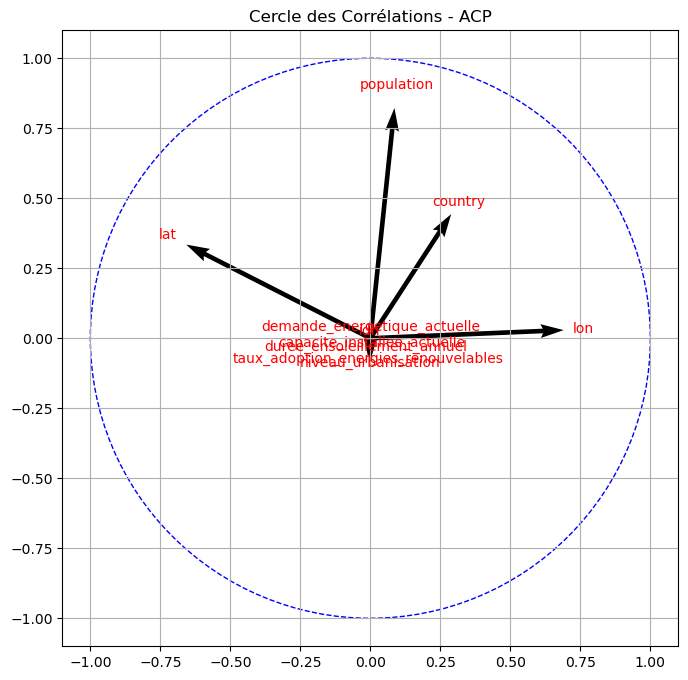

In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Charger les données
# df = pd.read_csv("votre_fichier.csv")  # Remplacez par vos données

# Standardisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Appliquer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Variance expliquée par chaque composante
explained_variance_ratio = pca.explained_variance_ratio_

# Propriétés des composantes principales
loadings = pca.components_

# Création du cercle des corrélations
fig, ax = plt.subplots(figsize=(8, 8))

# Affichage du cercle (cercle de rayon 1)
circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--')
ax.add_artist(circle)

# Tracer les flèches (variables) avec leurs labels
for i in range(len(X.columns)):
    ax.quiver(0, 0, loadings[0, i], loadings[1, i], angles='xy', scale_units='xy', scale=1)
    ax.text(loadings[0, i] * 1.1, loadings[1, i] * 1.1, X.columns[i], color='red', ha='center', va='center')

# Limiter les axes à [-1, 1]
ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
ax.set_aspect('equal', 'box')

# Titre
plt.title('Cercle des Corrélations - ACP')
plt.grid(True)
plt.show()


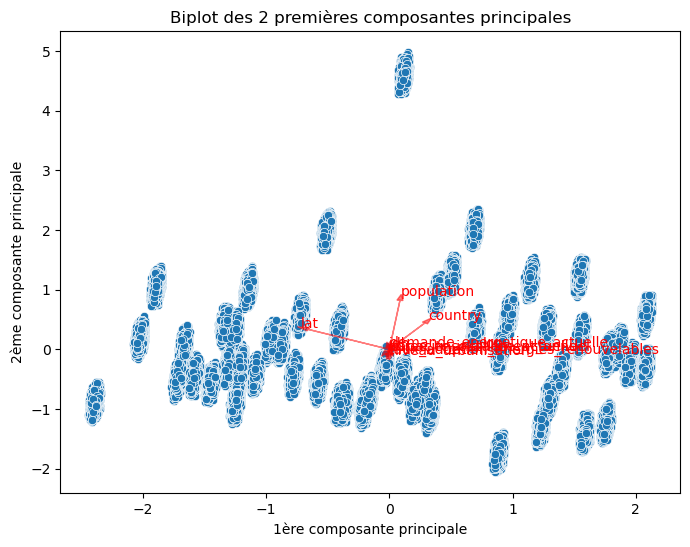

In [57]:
import seaborn as sns

# Biplot
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1])

# Ajout des vecteurs représentant les variables originales
for i in range(len(X_train.columns)):
    plt.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], 
              color='red', alpha=0.5, head_width=0.05, head_length=0.1)
    plt.text(pca.components_[0, i] * 1.1, pca.components_[1, i] * 1.1, 
             X_train.columns[i], color='red')

plt.title('Biplot des 2 premières composantes principales')
plt.xlabel('1ère composante principale')
plt.ylabel('2ème composante principale')
plt.show()


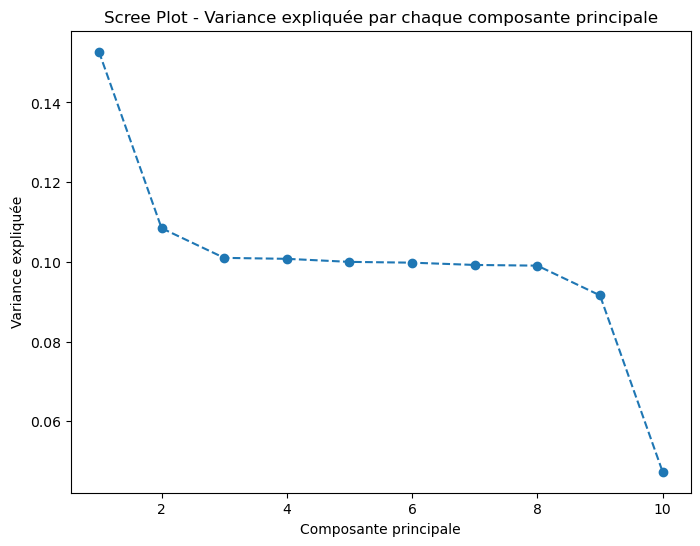

In [58]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Exemple de données
# X_train : votre jeu de données
X_train_scaled = StandardScaler().fit_transform(X_train)  # Standardisation des données

# Application de l'ACP
pca = PCA()
pca.fit(X_train_scaled)

# Calcul de la variance expliquée
explained_variance = pca.explained_variance_ratio_

# Graphique Scree Plot
plt.figure(figsize=(8,6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Scree Plot - Variance expliquée par chaque composante principale')
plt.xlabel('Composante principale')
plt.ylabel('Variance expliquée')
plt.show()


In [59]:
from sklearn.metrics import mean_squared_error
import numpy as np
model =  BayesianRidge()  # Exemple avec un RandomForest
model.fit(train_X, train_y)

# Calculer la RMSE avec toutes les variables
y_pred_all = model.predict(X_test)
rmse_all = np.sqrt(mean_squared_error(y_test, y_pred_all))
print(f"RMSE avec toutes les variables: {rmse_all:.4f}")


# Sélectionner les variables importantes (par exemple, celles ayant des valeurs SHAP non négligeables)
important_features = ["demande_energetique_actuelle"]
X_test_important = X_test[important_features]
X_train_important = X_train[important_features]  # Assurez-vous que ces variables sont aussi sélectionnées dans le jeu d'entraînement

# Réentraînement du modèle avec seulement les variables importantes
model.fit(X_train_important, y_train)
y_pred_important = model.predict(X_test_important)
rmse_important = np.sqrt(mean_squared_error(y_test, y_pred_important))
print(f"RMSE avec seulement les variables importantes: {rmse_important:.4f}")

# Comparaison des RMSE
print(f"Différence de RMSE: {rmse_all - rmse_important:.4f}")

RMSE avec toutes les variables: 796.6450
RMSE avec seulement les variables importantes: 796.6045
Différence de RMSE: 0.0405


In [ ]:
line=model.predict(datatest[['demande_energetique_actuelle']])

# Création de l'ID en fonction de la longueur de `line`
ids = range(1, len(line) + 1)

# Création du DataFrame avec les colonnes attendues
submission_df = pd.DataFrame({
    'id': ids,
    'demande_energetique_projectee': line
})

# Spécifiez le nom de votre fichier de sortie
output_file = 'submissionv.csv'

# Exporter le DataFrame au format CSV
submission_df.to_csv(output_file, index=False)

print(f"Le fichier {output_file} a été exporté avec succès.")

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Supposons que vous avez un DataFrame appelé `data`
# avec les colonnes 'demande_energetique_actuelle' et 'demande_energetique_future'
data=data_finale
# 1. Calculer la différence
data['delta_y'] = data['demande_energetique_projectee'] - data['demande_energetique_actuelle']
data_test['delta_y'] = data_test['demande_energetique_projectee'] - data_test['demande_energetique_actuelle']
# 2. Sélection des caractéristiques (features) et de la cible (target)
X2 = data.drop(columns=['demande_energetique_projectee', 'delta_y'])
y2 = data['delta_y']
train_X2=X2
train_y2=y2
test_X2=data_test.drop(columns=['demande_energetique_projectee', 'delta_y'])
test_y2=data_test['delta_y']


# 3. Split des données en train et test
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Entraînement du modèlen
model =  LinearRegression()
model.fit(train_X2,train_y2)

# 5. Prédiction de delta_y pour l'ensemble de test
y_pred_delta = model.predict(test_X2)

# 6. Calcul de la demande énergétique future estimée
demande_energetique_actuelle_test = X_test['demande_energetique_actuelle']
y_pred_future = demande_energetique_actuelle_test + y_pred_delta

# 7. Calculer le RMSE entre la demande énergétique future réelle et celle estimée
y_true_future = data.loc[y_test.index, 'demande_energetique_projectee']
rmse = np.sqrt(mean_squared_error(y_true_future, y_test))

print("RMSE :", rmse)
